In [83]:
%load_ext autoreload
%autoreload 2
%env CUDA_VISIBLE_DEVICES=1

import numpy as np
import sys
import os
import matplotlib.pyplot as plt
import vis_utils

from utils.utils import get_path
from utils.io_utils import load_multiple_res, read_ripser_result
from utils.toydata_utils import get_toy_data
from utils.fig_utils import dataset_to_print, plot_dgm_loops, dist_to_print, plot_edges_on_scatter
from utils.pd_utils import sort_cycle
from utils.confidence_utils import median_max_life_time, get_bottleneck_dist
from utils.passing_cells_utils import distribution_max, distribution_split

from vis_utils.loaders import load_dataset
from vis_utils.plot import plot_scatter
from vis_utils.utils import load_dict, save_dict
from vis_utils.tsne_wrapper import TSNEwrapper
from vis_utils.confidence import fig_bottleneck, fig_bottleneck_max, fig_bottleneck_median_scale, get_life_geq_scale, get_life_geq_metrics

from openTSNE.affinity import Affinities

import umap
from ripser import Rips
from ripser.ripser import get_greedy_perm

from mpl_toolkits.axes_grid1 import make_axes_locatable

from matplotlib import collections  as mc
from matplotlib.colors import Normalize
import matplotlib.cm

from openTSNE.nearest_neighbors import PrecomputedNeighbors
from openTSNE.affinity import PerplexityBasedNN

from vis_utils.utils import kNN_graph, kNN_dists
from scipy.spatial.distance import pdist, squareform
import glasbey
import scipy.sparse
import networkx as nx

from sklearn.decomposition import PCA

from persim import plot_diagrams
from utils.pd_utils import get_life_times
import pandas as pd

from vis_utils.total_variation import total_variation_matrix

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: CUDA_VISIBLE_DEVICES=1





<h4 style="background-color: yellow; padding: 5px;">

from notebooks/thre_10x_orange_new_splits_bottleneck_matrix.ipynb and notebooks/thre_10x_orange_new_splits_bottleneck_row.ipynb

</h4>



In [84]:
root_path = get_path("data")
fig_path = get_path("figures")
seeds = [0]
k = 15

style_file = "utils.style"
plt.style.use(style_file)

distances = {
    # "euclidean": [{}],
    "diffusion": [
        {"k": 15, "t": 8, "kernel": "sknn", "include_self": False},
        {"k": 100, "t": 8, "kernel": "sknn", "include_self": False},
        {"k": 15, "t": 64, "kernel": "sknn", "include_self": False},
        {"k": 100, "t": 64, "kernel": "sknn", "include_self": False},
    ],
    "eff_res": [
        {"corrected": True, "weighted": False, "k": 15, "disconnect": True},
        {"corrected": True, "weighted": False, "k": 100, "disconnect": True},
    ],
}

In [ ]:
def complete_linkage_splits(sex_mat, sex_idx, threshold = 0.8):
    link = linkage(squareform(sex_mat), method='complete')
    clusters = fcluster(link, t=threshold, criterion='distance')
    
    sex_dict = {}
    n_splits = []
    n_loops = []
    for i in range(max(clusters)):
        sex_dict[f'{i}'] = [[a for a, b  in enumerate(clusters) if b == i+1], [sex_idx[a] for a, b  in enumerate(clusters) if b == i+1]]
        n_splits.append(len(set([c[:2] for c in sex_dict[f'{i}'][1]])))
        n_loops.append(len(sex_dict[f'{i}'][1]))
    
    return  sex_dict, n_splits, n_loops

In [ ]:
def pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters, save = False):
    # trim_list_of_communities, trim_data, trim_idx,

    n_column = 15
    
    top_idx = np.argsort(n_splits)[::-1][:top_n_clusters]
    
    new_sex_dict = {}
    for cluster in top_idx:
        new_sex_dict[str(cluster)] = sex_dict[str(cluster)]
    
    
    top_n_loops = [n_loops[i] for i in top_idx]
    top_rows = [int(np.ceil(i/15)) for i in top_n_loops]
    n_row = sum(top_rows)
    
    fig, ax = plt.subplots(n_row, n_column, figsize=(n_column, n_row), constrained_layout=True)
    
    distances = {
        # "euclidean": [{}],
            "diffusion": [
            {"k": 15, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 8, "kernel": "sknn", "include_self": False},
            {"k": 15, "t": 64, "kernel": "sknn", "include_self": False},
            {"k": 100, "t": 64, "kernel": "sknn", "include_self": False},
        ],
        "eff_res": [
            {"corrected": True, "weighted": False, "k": 15, "disconnect": True},
            {"corrected": True, "weighted": False, "k": 100, "disconnect": True},
        ],
    }
    root_path = get_path("data")
    sex_data = [f"yao_10x_male_orange_split_{i}" for i in range(10)]+ [f"yao_10x_female_orange_split_{i}" for i in range(5)]
    embds = [f"embd_10x_male_orange_split_{i}" for i in range(10)]+ [f"embd_10x_female_orange_split_{i}" for i in range(5)]
    for i, dataset in enumerate(sex_data):
        all_res = load_multiple_res(datasets=dataset, n=None, embd_dims=None, sigmas=None, distances=distances, seeds=0, root_path=root_path, n_threads=1)
    
        globals()[f"res_{i}"] = {}
        a= 0
        for distance in all_res.values():
            for key, value in distance.items():
               globals()[f"res_{i}"][a] =  value
               a+=1
        globals()[f"enm_{i}"] =  np.load(os.path.join(root_path, f"embd_n_mask/embd_after_procrustes/{embds[i]}.npy"))
    
    plot_loops = True
    tab10 = matplotlib.colormaps.get_cmap("tab10")
    existing_colors = [tab10(1)]
    colors = glasbey.extend_palette(existing_colors, n_column+len(existing_colors)+5)[len(existing_colors)+1:]

    row = 0
    for i, cluster in enumerate(top_idx):
        end_row = row + top_rows[i]
        
        axes_flat = ax[row:end_row][:].ravel()
        idxs = new_sex_dict[str(cluster)][1]
        order_15 = []
        order_6 = []
        order_rank = []
        for idx in idxs:
            order_6.append(int(idx[2]))
            order_rank.append(int(idx[3]))
            if idx[0] == "0":
                order_15.append(int(idx[1]))
            elif idx[0] == "1":
                order_15.append(int(idx[1])+10)
        # ax[row][0].set_title(f"{len(set(order_15))}", fontsize = 15)
        row = end_row
        for j in range(len(idxs)):
            cax = axes_flat[j]
            res = globals()[f"res_{order_15[j]}"][order_6[j]]
            embd_n_mask = globals()[f"enm_{order_15[j]}"]
            cax.set_title(f"{new_sex_dict[str(cluster)][1][j]}", fontsize = 5)
            if order_15[j] < 10:
                cax.set_xlim(-70, -15)
                cax.set_ylim(20, 70)
            else:
                cax.set_xlim(-90, -40)
                cax.set_ylim(-10, 50)
                
            life_times_loops = get_life_times(res, dim=1)
            loop_idx_sorted = np.argsort(life_times_loops)[::-1][order_rank[j]]
            
            plot_scatter(cax, embd_n_mask, y="k", s=1, alpha=1, scalebar=False)
            plot_edges_on_scatter(ax=cax,
                                edge_idx=res["cycles"][1][loop_idx_sorted],
                                x=embd_n_mask,
                                color=colors[order_15[j]+1],
                                linewidth=1)
    
    for axx in ax.flat:
        axx.axis('off')
    fig.suptitle(f"10x, both sex", fontsize =5)       
    plt.show()
    if isinstance(save,str):
        fig.savefig(os.path.join(get_path("figures"), f"{save}.png"), dpi=300)


# 2 *  median, row

In [ ]:
dist_female_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_median_scale_row/dist_10x_female_orange_splits_scale_2.pkl"))
dist_male_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_median_scale_row/dist_10x_male_orange_splits_scale_2.pkl"))


In [ ]:
both_density = np.vstack([dist_male_orange["density"], dist_female_orange["density"]])

In [ ]:
both_mat = total_variation_matrix(both_density, both_density)

In [ ]:
both_idx = [f"0{a}" for a in np.array(dist_male_orange["idx"])] + [f"1{a}" for a in np.array(dist_female_orange["idx"])]

In [ ]:
ratio = []
for thre in [0.5, 0.6, 0.7, 0.8, 0.9]:
    sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = thre)
    ratio.append(sum(sorted(n_loops)[::-1][:2])/sum(n_loops))

In [ ]:
ratio

[0.2397003745318352,
 0.31086142322097376,
 0.3258426966292135,
 0.4943820224719101,
 0.6142322097378277]

In [ ]:
sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = 0.9)

In [ ]:
n_loops

[3, 77, 87, 18, 10, 9, 5, 15, 15, 2, 26]

In [ ]:
n_splits

[3, 15, 15, 10, 7, 7, 3, 10, 9, 2, 13]

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

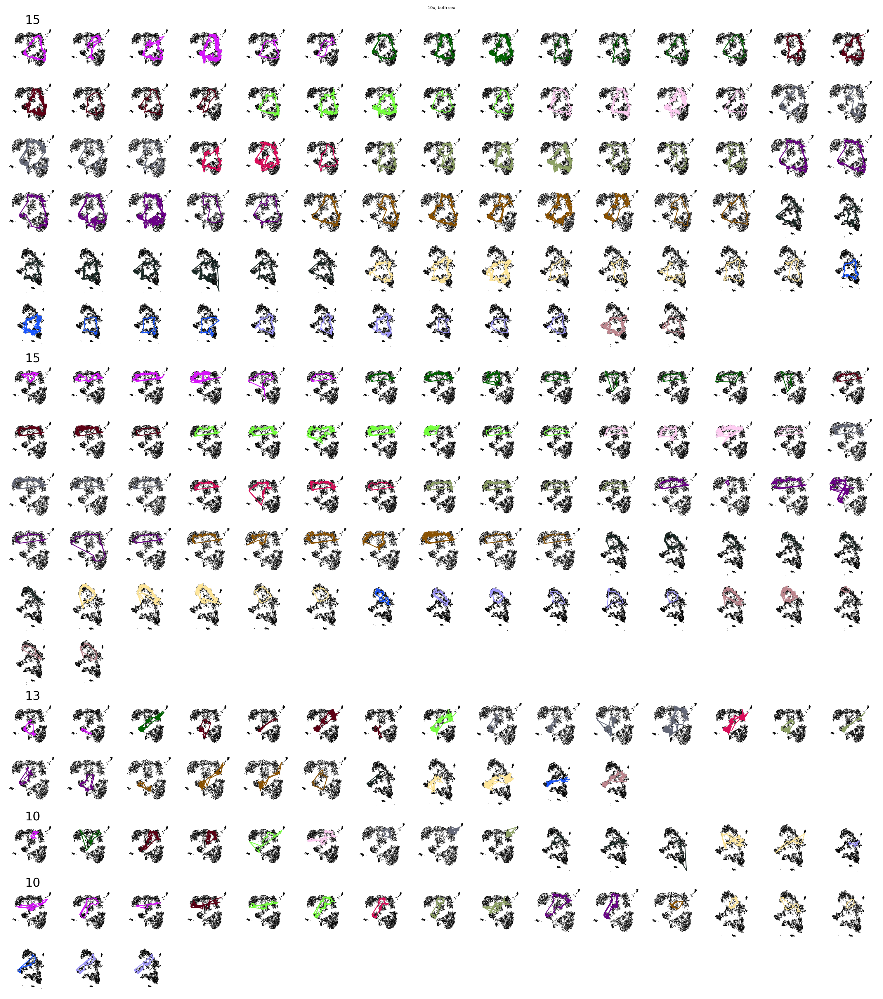

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 5, save = "median4_thre90_partial")

# 4 *  std (matrix)

In [ ]:
dist_female_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_std_scale/dist_10x_female_orange_splits_scale_4.pkl"))
dist_male_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_std_scale/dist_10x_male_orange_splits_scale_4.pkl"))


In [ ]:
both_density = np.vstack([dist_male_orange["density"], dist_female_orange["density"]])

In [ ]:
both_density.shape

(68, 61)

In [ ]:
both_mat = total_variation_matrix(both_density, both_density)

In [ ]:
both_idx = [f"0{a}" for a in np.array(dist_male_orange["idx"])] + [f"1{a}" for a in np.array(dist_female_orange["idx"])]

In [ ]:
ratio = []
for thre in [0.5, 0.6, 0.7, 0.8, 0.9]:
    sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = thre)
    ratio.append(sum(sorted(n_loops)[::-1][:2])/sum(n_loops))

In [ ]:
ratio

[0.5294117647058824,
 0.8529411764705882,
 0.8529411764705882,
 0.8529411764705882,
 0.9411764705882353]

In [ ]:
sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = 0.9)

In [ ]:
for key in sex_dict.keys():
    stat = np.zeros((15,6))
    for hyperparameter in sex_dict[key][1]:
        if hyperparameter[0] == "0":
            i = int(hyperparameter[1])
        else:
            i = int(hyperparameter[1])+10
        j = int(hyperparameter[2])
        
        stat[i,j]+= 1.0
    
    print(key)
    print(stat)
    print(np.count_nonzero(stat, axis=0))

0
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[0 0 0 0 1 2]
1
[[0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]
 [1. 2. 1. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]]
[ 7 13  1  0  0  9]
2
[[0. 1. 1. 1. 0. 1.]
 [0. 1. 1. 0. 0. 1.]
 [0. 0. 1. 0. 0. 1.]
 [1. 1. 1. 0. 1. 1.]
 [0. 1. 1. 0. 0. 1.]
 [0. 0. 1. 0. 0. 1.]
 [0. 0. 1. 1. 0. 1.]
 [1. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0.]
 [1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[3 7 9 4 1 9

In [ ]:
n_loops, n_splits

([3, 25, 6, 2, 4, 1, 4, 5, 10, 1, 2, 2, 2, 1],
 [2, 10, 6, 1, 4, 1, 4, 5, 6, 1, 2, 2, 2, 1])

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

Done with yao_10x_male_orange_split_9 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_9 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_9 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_9 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_female_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_female_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_female_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_female_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_Fals

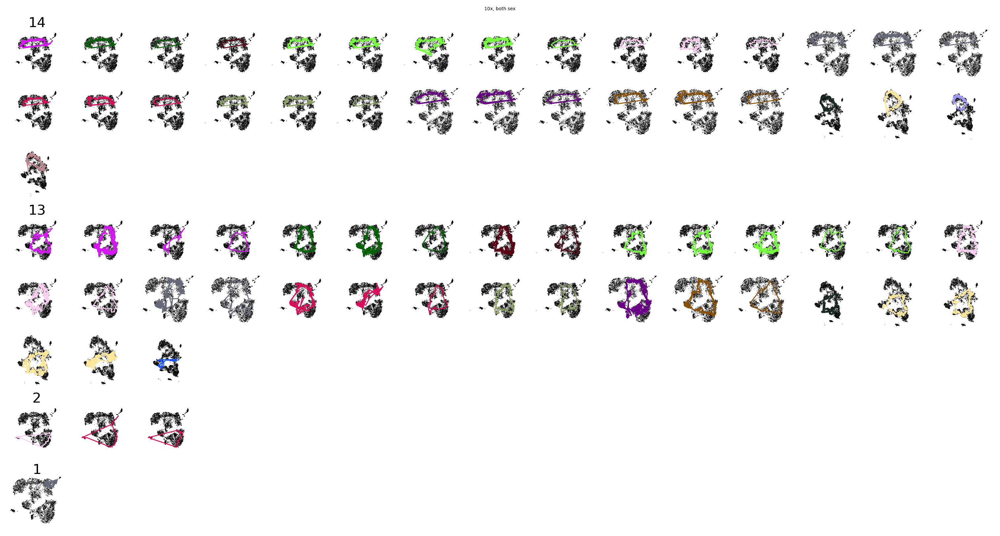

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 6, save = False)

# 90 percentile  (matrix)

In [ ]:
dist_female_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_90/dist_10x_female_orange_splits.pkl"))
dist_male_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_90/dist_10x_male_orange_splits.pkl"))


In [ ]:
both_density = np.vstack([dist_male_orange["density"], dist_female_orange["density"]])

In [ ]:
both_density.shape

(72, 61)

In [ ]:
both_mat = total_variation_matrix(both_density, both_density)

In [ ]:
both_mat.shape

(72, 72)

In [ ]:
both_idx = [f"0{a}" for a in np.array(dist_male_orange["idx"])] + [f"1{a}" for a in np.array(dist_female_orange["idx"])]

In [ ]:
sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = 0.9)

In [ ]:
n_splits

[14, 3, 14, 1]

In [ ]:
ratio = []
for thre in [0.5, 0.6, 0.7, 0.8, 0.9]:
    sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = thre)
    ratio.append(sum(sorted(n_loops)[::-1][:2])/sum(n_loops))

In [ ]:
ratio

[0.5277777777777778,
 0.8611111111111112,
 0.8611111111111112,
 0.9305555555555556,
 0.9305555555555556]

In [ ]:
for key in sex_dict.keys():
    stat = np.zeros((15,6))
    for hyperparameter in sex_dict[key][1]:
        if hyperparameter[0] == "0":
            i = int(hyperparameter[1])
        else:
            i = int(hyperparameter[1])+10
        j = int(hyperparameter[2])
        
        stat[i,j]+= 1.0
    
    print(key)
    print(stat)
    print(np.count_nonzero(stat, axis=0))

0
[[1. 1. 0. 0. 0. 0.]
 [1. 1. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 1.]
 [1. 2. 1. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [1. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]]
[10 13  1  0  0 10]
1
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]]
[1 0 0 0 1 2]
2
[[0. 1. 1. 0. 0. 1.]
 [0. 1. 1. 0. 0. 1.]
 [0. 0. 0. 0. 0. 1.]
 [1. 1. 1. 0. 0. 1.]
 [0. 1. 1. 0. 0. 1.]
 [0. 0. 1. 0. 0. 1.]
 [0. 0. 1. 1. 0. 1.]
 [1. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 1.]
 [0. 1. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0.]
 [1. 1. 1. 1. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[ 4  7  8  3

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

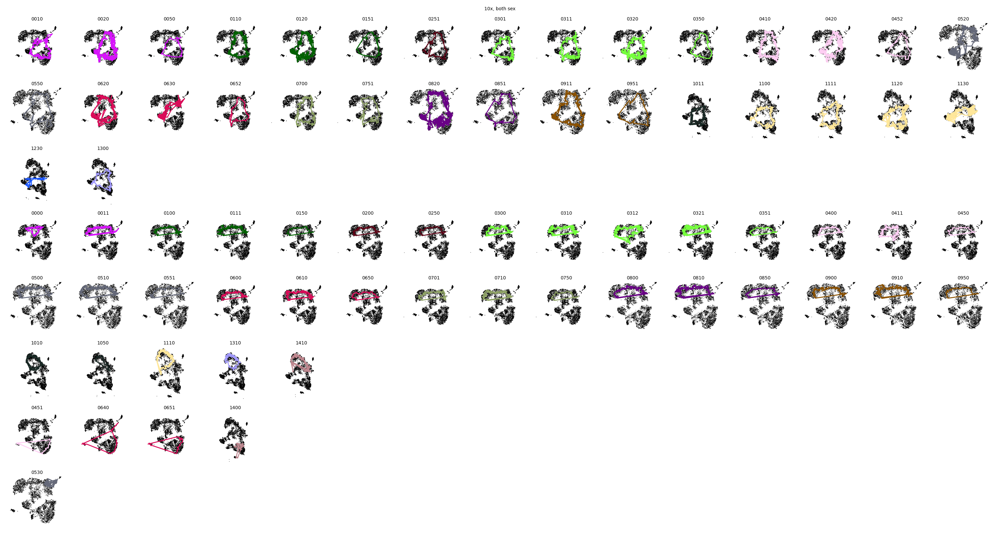

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 5, save = False)

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

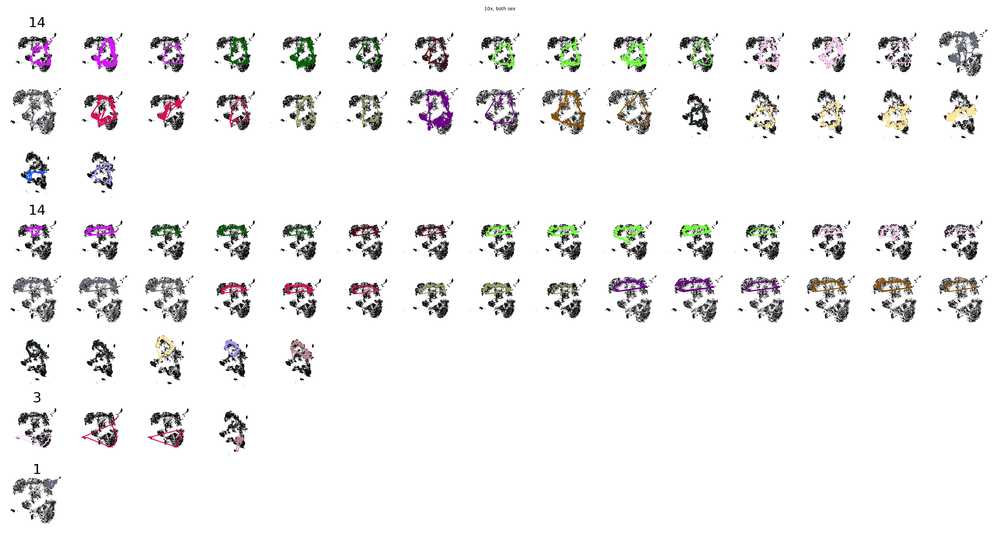

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 5, save = False)

# 3 * std  (matrix)

In [ ]:
dist_female_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_std_scale/dist_10x_female_orange_splits_scale_3.pkl"))
dist_male_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_std_scale/dist_10x_male_orange_splits_scale_3.pkl"))


In [ ]:
both_density = np.vstack([dist_male_orange["density"], dist_female_orange["density"]])

In [ ]:
both_mat = total_variation_matrix(both_density, both_density)

In [ ]:
both_mat.shape

(173, 173)

In [ ]:
both_idx = [f"0{a}" for a in np.array(dist_male_orange["idx"])] + [f"1{a}" for a in np.array(dist_female_orange["idx"])]

In [ ]:
sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = 0.9)

In [ ]:
for key in sex_dict.keys():
    stat = np.zeros((15,6))
    for hyperparameter in sex_dict[key][1]:
        if hyperparameter[0] == "0":
            i = int(hyperparameter[1])
        else:
            i = int(hyperparameter[1])+10
        j = int(hyperparameter[2])
        
        stat[i,j]+= 1.0
    
    print(key)
    print(stat)
    print(np.count_nonzero(stat, axis=0))

0
[[0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 2. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 2. 0. 0.]]
[0 0 0 8 0 1]
1
[[0. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 1.]
 [1. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0.]
 [2. 0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 1. 1.]
 [0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 1. 1. 0. 1. 1.]
 [1. 1. 0. 0. 0. 0.]
 [0. 0. 2. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0.]]
[4 3 6 0 3 5]
2
[[0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0.]]
[1 1 0 0 2 0]
3
[[

In [ ]:
sum(n_loops)

173

In [ ]:
n_splits

[9, 10, 4, 3, 5, 13, 11, 14, 5]

In [ ]:
n_loops

[15, 23, 4, 3, 8, 42, 20, 53, 5]

In [ ]:
ratio = []
lens = []
for thre in [0.5, 0.6, 0.7, 0.8, 0.9]:
    sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = thre)
    lens.append(len(n_loops))
    ratio.append(sum(sorted(n_loops)[::-1][:2])/sum(n_loops))

In [ ]:
lens

[33, 22, 16, 12, 9]

In [ ]:
ratio

[0.3179190751445087,
 0.35260115606936415,
 0.3930635838150289,
 0.4913294797687861,
 0.5491329479768786]

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

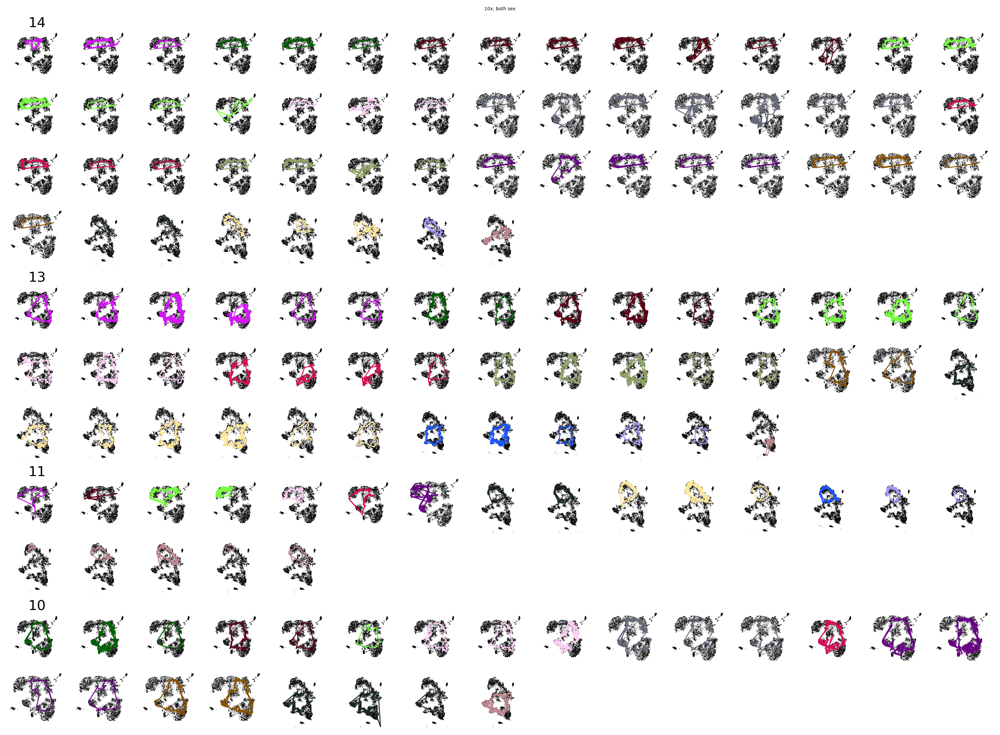

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 4, save = False)

# 2 * median, matrix

In [ ]:
dist_female_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_median_2_mat/dist_10x_female_orange_splits.pkl"))
dist_male_orange = load_dict(os.path.join(root_path,"dist_bottleneck_newsplit_median_2_mat/dist_10x_male_orange_splits.pkl"))


In [ ]:
both_density = np.vstack([dist_male_orange["density"], dist_female_orange["density"]])

In [ ]:
both_mat = total_variation_matrix(both_density, both_density)

In [ ]:
both_mat.shape

(225, 225)

In [ ]:
both_idx = [f"0{a}" for a in np.array(dist_male_orange["idx"])] + [f"1{a}" for a in np.array(dist_female_orange["idx"])]

In [ ]:
sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = 0.95)

In [ ]:
ratio = []
for thre in [0.5, 0.6, 0.7, 0.8, 0.9]:
    sex_dict, n_splits, n_loops = complete_linkage_splits(both_mat, both_idx, threshold = thre)
    ratio.append(sum(sorted(n_loops)[::-1][:2])/sum(n_loops))

In [ ]:
ratio

[0.27555555555555555,
 0.31555555555555553,
 0.32,
 0.49777777777777776,
 0.5155555555555555]

In [ ]:
n_splits, n_loops

([13, 15, 14, 3, 5, 8, 6, 15], [49, 33, 32, 5, 6, 19, 9, 72])

Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_15_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None diffusion_k_100_t_64_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_15_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_0 None eff_res_corrected_True_weighted_False_k_100_disconnect_True n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_15_t_8_kernel_sknn_include_self_False n_outliers=0, perturbation=None
Done with yao_10x_male_orange_split_1 None diffusion_k_100_t_8_kernel_sknn_include_self_False n_outlie

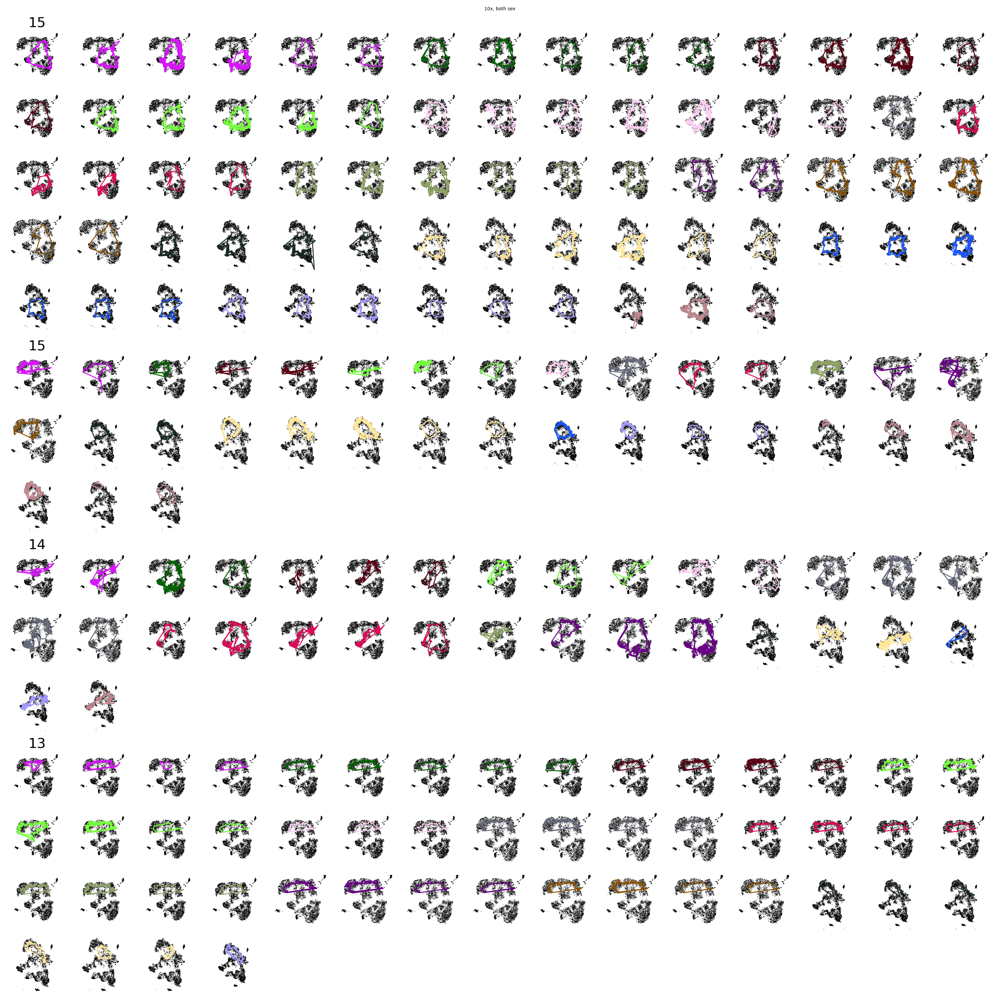

In [ ]:
pic_splits_loops(sex_dict, n_splits, n_loops, top_n_clusters = 4, save = False)